In [10]:
from __init__ import DATASET_PATH


import pandas as pd
import seaborn as sns
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedFormatter, FixedLocator

from textwrap import wrap

from main.constants import CONTINUOUS_ATTRIBUTES, CATEGORICAL_ATTRIBUTES

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200) # enable showing all columns of the df

In [8]:
dataset_file_path = DATASET_PATH
df = pd.read_csv(dataset_file_path)
df.sample(5)

,"PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro",IGF-1 ng/ml (N: 100-311),proBNP,"AMH (ng/ml) *7,14=pmol/l",weight,height (cm),BMI,systolic BP (ciśnienie skurczowe),diastolic BP (ciśnienie rozskurczowe),Hypertension,Waist Circumference (WC),WC>88,Hip Circumference (HC),WHR (Waist/Hip ratio),"WHR>0,85 (WHO)","WHR>0,8 (NIDDK)",WHTR (Waist/Height Ratio),"WHTR>0,5","overweight/obesity 0-normal/low, 1-overweight, 2-obesity","irregular cycles (0-nie, 1-tak)","ovulation (0-brak, 1-obecna)","PCO ovary morfology in USG (0-brak, 1--obecna)","stromal hypertrophy in ovary (0-brak, 1-obecny)",acne,hirsutism,FG score (Ferriman-Gallway score - stopień androgenizacji),hyperandrogenism,elevated DHT,hypothyroidism,Volume of the thyroid Right Lobe,Volume of the thyroid Left Lobe,thyroid volume,"nodules 0-lack, 1-RL, 2-LL, 3-both",chronic thyroiditis,Vole of the Right Ovary,Volume of the Left Ovary,ovaries volume - total,follicules >12,WBC x10^3/ul,neutrophil x10^3/ul,lymphocytes x10^3/ul,monocytes x10^3/ul,eosinocytes x10^3/ul,basophils x10^3/ul,% neutrophil,% lymphocytes,% monocytes,%eosinocytes,%basophils,RBC x10^6ul,Hemoglobin [g/dl],hematocrit [%],HTC/Hb,MCV fl,MCH pg,MCHC g/dl,RDW-CV %,PLT x10^3/ul,PDW fl,MPV fl,P-LCR %,PLT/WBC,MPV/PLT,PLR,limf/mono,NLR (stosunek neutrofili do limfocytów),L/WCC (leukocyty do całkowitej liczby krwinek białych),eos/leukocyty,sodium mmol/l,potassium mmol/l,calcium mg/dl,phosphorus mg/dl,creatinine mg/dl,CRP mg/l,ALT U/l,AST U/l,Bilirubin mg/dl,CHOL mmol/l,CHOL>200,HDL mmol/l,HDL<50,LDL mmol/l,LDL>135,TG mmol/l,Atherogenic index (AI) (LDL-C/HDL-C),coronary risk index (CRI) (TG/HDL-C),VAI - Visceral adiposity index,BAI - Body adiposity index,LAP INDEX - Lipid accumulation product index,TyG Index - Trigliceride-glucose index,AIP -Atherogenic index of plasma,UIBC ug/dl,ferrum ug/dl,TIBC,TSAT,ferritin ng/ml,glucose 0 mg/dl,glucose 120 mg/dl,insulin 0 uU/ml,Insulin 120 uU/ml,HOMA,Matsuda,"QUICKI (N<0,357)",TSH mIU/L,FT3 pmol/l,FT4 pmol/l,Anty-TPO IU/ml,Anty-TG IU/ml,FSH mlU/ml,LH,LH/FSH,prolactin,DHEA-S ug/dl,testosterone nmol/l,T (ng/ml),T/SHBG,E(pg/ml)/T(ng/ml)/,Parathormone pg/ml,cortisol nmol/l 8:00,cortisol nmol/l 18:00,Estradiol pg/ml,SHBG nmol/l,SHBG>110,FTI (free testosterone index),ACTH pg/ml,HbA1c %,vitamin 25-OH D ng/ml,Androstendione ng/ml,17-OH-progesterone ng/ml,Dihydrotestosterone pg/ml (N<368),Testosterone/DHT,T/A (testosterone/androstendione),age
657,1,219.0,44.12,34.420000,71.0,170.0,24.567474,126.0,86.0,0.0,80.0,0.0,86.0,0.930233,1.0,1.0,0.470588,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,10.0,1.0,1.0,1.0,6.3750,5.6400,12.0150,0.0,1.0,18.70,22.59,41.29,1.0,6.37,3.59,1.68,0.47,0.56,0.07,53.6,26.4,7.4,8.8,1.1,4.28,13.3,37.8,2.842105,88.3,31.1,35.2,12.4,221.0,13.2,10.9,32.4,34.693878,0.049321,131.547619,3.574468,2.136905,0.263736,0.087912,144.0,4.28,9.50,2.21,0.95,0.6,8.0,15.0,0.70,4.75824,0.0,1.49988,0.0,2.578242,0.0,1.49028,1.718966,2.275862,1.796868,32.588235,32.78616,4.662727,0.357146,135.0,191.0,326.0,58.0,26.0,85.0,73.0,6.59,17.21,1.383086,13.78,0.363861,3.70,5.01,14.59,15.0,251.0,4.9,14.8,3.020408,311.0,193.0,2.7,0.778098,0.057325,100.244444,29.67,367.0,75.0,78.0,47.1,0.0,5.77,11.37,5.3,29.0,7.13,2.58,942.0,0.002866,0.378682,33.0
103,0,281.0,21.89,NaN,62.0,154.0,26.142688,120.0,80.0,0.0,81.0,0.0,90.0,0.900000,1.0,1.0,0.525974,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,13.0,1.0,1.0,1.0,2.4960,2.2165,4.7125,0.0,1.0,6.01,7.82,13.83,0.0,6.13,2.56,2.46,0.46,0.60,0.05,41.8,40.1,7.5,9.8,0.8,4.97,14.1,41.4,2.936170,83.3,28.4,34.1,12.1,349.0,13.2,11.0,34.1,56.933116,0.031519,141.869919,5.347826,1.040650,0.401305,0.097879,140.0,4.57,9.57,3.94,0.75,0.4,15.0,21.0,0.67,5.37888,1.0,1.47402,0.0,3.284220,0.0,1.36609,2.228070,2.122807,1.638224,40.441558,31.42007,4.607316,0.326911,NaN,187.0,424.0,44.0,37.0,83.0,92.0,9.38,39.10,1.922321,5.97,0.345867,1.69,6.85,19.76,10.0,17.0,2.1,1.9,0.904762,504.0,408.0,2.4,0.691643,0.016304,121.449999,44.39,214.0,55.0,84.0,147.2,1.0,1.63,14.32,5.0,15.0,4.26,3.31,978.0,0.002454,0.563380,1

In [14]:
from scipy.stats import zscore

def remove_outliers(series, threshold=3):
    # Calculate z-scores for the specific column
    z_scores = np.abs(zscore(series.dropna()))
    print("Z-scores calculated for column:", series.name)

    # Calculate how many entries remain after filtering
    filtered_entries = z_scores < threshold
    print(f"Filtering entries with threshold {threshold}: {filtered_entries.sum()} rows remaining out of {len(series)}. - {filtered_entries.sum()/len(series)*100:.2f}% of the data.")
    
    return series[filtered_entries].index


def plot_one_categorical_to_all_attributes(df, main_attribute, all_attributes, x_title, x_tick_labels, continuous_data=True, plot_name='plot', n_rows=29, n_cols=5, figsize=(25, 130), should_remove_outliers=False):
    other_attributes = all_attributes
    if main_attribute in other_attributes:
        other_attributes.remove(main_attribute)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    sns.set(font_scale = 1.5)

    for i, other_attribute in enumerate(other_attributes):
        ax = axes[int(i/n_cols)][i%n_cols]

        df_tmp = df.dropna(subset=[main_attribute, other_attribute])
        
        if should_remove_outliers:
            # Apply outlier removal to the specific column
            indices_to_keep = remove_outliers(df_tmp[other_attribute])
            df_tmp = df_tmp.loc[indices_to_keep]

        if continuous_data:
            # sns.boxenplot(data=df_tmp, x=main_attribute, y=other_attribute, hue=main_attribute, legend=False, ax=ax, palette="deep")
            sns.boxplot(data=df_tmp, x=main_attribute, y=other_attribute, hue=main_attribute, legend=False, ax=ax, palette="deep")
        else:
            sns.histplot(data=df_tmp, x=main_attribute, hue=other_attribute, multiple="fill", ax=ax, palette="deep")
            legend = ax.get_legend()
            legend.set_title("\n".join(wrap(other_attribute, 40)))
            legend.set_alpha(0.5)  # Adjust the alpha value (0 to 1) as needed

            sns.move_legend(ax, loc='upper right')

            # counts = df_tmp.groupby([main_attribute, other_attribute]).size().reset_index(name='count')
            # sns.scatterplot(data=counts, x=main_attribute, y=other_attribute, ax=ax, size='count', legend=False, sizes=(100, 1000))
        

        # ax.set_title("\n".join(wrap(other_attribute, 40)) + '\n')
        x_ticks = sorted(df_tmp[main_attribute].unique().tolist())
        
        ax.xaxis.set_major_locator(FixedLocator(x_ticks))
        ax.xaxis.set_major_formatter(FixedFormatter(x_tick_labels))
        ax.set_xlabel("\n".join(wrap(x_title, 40)))
        ax.set_ylabel("\n".join(wrap(other_attribute, 30)))

    fig.tight_layout()
    # plt.savefig(f'../charts/box_plots/{main_attribute}/{plot_name}.pdf')
    plt.show()

In [6]:
def plot_scatter_split_by_diagnosis(df, main_attribute, attributes, should_remove_outliers=False):
    if main_attribute in attributes:
        attributes.remove(main_attribute)

    for other_attribute in attributes:
        df_tmp = df.dropna(subset=[main_attribute, other_attribute])

        if should_remove_outliers:
            # Apply outlier removal to the specific column
            indices_to_keep = remove_outliers(df_tmp[other_attribute])
            df_tmp = df_tmp.loc[indices_to_keep]

        hue_values = ['healthy control', 'PCOS', 'FHA', 'POF', 'High Andro']
        palette = sns.color_palette("deep")

        grid = sns.FacetGrid(df_tmp, col="PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro", col_wrap=5)

        # Map a scatter plot to each subset of data
        for i, hue_value in enumerate(hue_values):
            # sns.scatterplot(data=df_tmp[df_tmp["PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro"] == i],
            #                 x=main_attribute, y=other_attribute, ax=grid.axes[i], color=palette[i])
            sns.scatterplot(data=df_tmp[df_tmp["PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro"] == i],
                            x=other_attribute, y=main_attribute, ax=grid.axes[i], color=palette[i])

        # Set titles for each subplot
        for i, ax in enumerate(grid.axes.flat):
            ax.set_title(hue_values[i])

        grid.set_axis_labels("\n".join(wrap(other_attribute, 20)), main_attribute)
        plt.tight_layout()
        plt.show()


In [9]:
df.loc[df['Anty-TPO IU/ml'] > 150, 'Anty-TPO IU/ml'] = np.nan
df.loc[df['Anty-TG IU/ml'] > 300, 'Anty-TG IU/ml'] = np.nan
df.loc[df['FSH mlU/ml'] > 15, 'FSH mlU/ml'] = np.nan

In [11]:
CATEGORICAL_ATTRIBUTES

['PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro',
 'Hypertension',
 'WC>88',
 'WHR>0,85 (WHO)',
 'WHR>0,8 (NIDDK)',
 'WHTR>0,5',
 'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
 'irregular cycles (0-nie, 1-tak)',
 'ovulation (0-brak, 1-obecna)',
 'PCO ovary morfology in USG (0-brak, 1--obecna)',
 'stromal hypertrophy in ovary (0-brak, 1-obecny)',
 'acne',
 'hirsutism',
 'hyperandrogenism',
 'elevated DHT',
 'hypothyroidism',
 'nodules 0-lack, 1-RL,  2-LL, 3-both',
 'chronic thyroiditis',
 'follicules >12',
 'CHOL>200',
 'HDL<50',
 'LDL>135',
 'SHBG>110']

In [25]:
def plot_boxplots_for_categorical_attribute(df, categorical_attribute, x_tick_labels, plot_name_prefix, x_title=''):
    plot_one_categorical_to_all_attributes(df, 
                                        main_attribute=categorical_attribute,
                                        all_attributes=list(CONTINUOUS_ATTRIBUTES),
                                        x_tick_labels=x_tick_labels,
                                        x_title=x_title,
                                        continuous_data=True,
                                        plot_name=f'{plot_name_prefix}_continous_attributes',
                                        n_rows=28,
                                        n_cols=4,
                                        figsize=(25, 120),
                                        should_remove_outliers=True)

### WHR > 0.85

Z-scores calculated for column: IGF-1 ng/ml (N: 100-311)
Filtering entries with threshold 3: 524 rows remaining out of 532. - 98.50% of the data.
Z-scores calculated for column: proBNP
Filtering entries with threshold 3: 504 rows remaining out of 508. - 99.21% of the data.
Z-scores calculated for column: AMH (ng/ml) *7,14=pmol/l
Filtering entries with threshold 3: 392 rows remaining out of 400. - 98.00% of the data.
Z-scores calculated for column: weight
Filtering entries with threshold 3: 760 rows remaining out of 769. - 98.83% of the data.
Z-scores calculated for column: height (cm)
Filtering entries with threshold 3: 765 rows remaining out of 769. - 99.48% of the data.
Z-scores calculated for column: BMI
Filtering entries with threshold 3: 755 rows remaining out of 769. - 98.18% of the data.
Z-scores calculated for column: systolic BP (ciśnienie skurczowe)
Filtering entries with threshold 3: 601 rows remaining out of 602. - 99.83% of the data.
Z-scores calculated for column: diastol

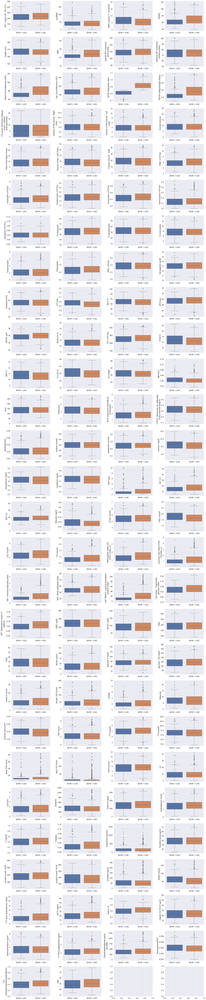

In [23]:
plot_boxplots_for_categorical_attribute(df, 'WHR>0,85 (WHO)', ['WHR < 0,85', 'WHR > 0,85'], 'WHR')

### WHTR > 0.5

Z-scores calculated for column: IGF-1 ng/ml (N: 100-311)
Filtering entries with threshold 3: 525 rows remaining out of 533. - 98.50% of the data.
Z-scores calculated for column: proBNP
Filtering entries with threshold 3: 504 rows remaining out of 508. - 99.21% of the data.
Z-scores calculated for column: AMH (ng/ml) *7,14=pmol/l
Filtering entries with threshold 3: 392 rows remaining out of 400. - 98.00% of the data.
Z-scores calculated for column: weight
Filtering entries with threshold 3: 761 rows remaining out of 770. - 98.83% of the data.
Z-scores calculated for column: height (cm)
Filtering entries with threshold 3: 766 rows remaining out of 770. - 99.48% of the data.
Z-scores calculated for column: BMI
Filtering entries with threshold 3: 756 rows remaining out of 770. - 98.18% of the data.
Z-scores calculated for column: systolic BP (ciśnienie skurczowe)
Filtering entries with threshold 3: 602 rows remaining out of 603. - 99.83% of the data.
Z-scores calculated for column: diastol

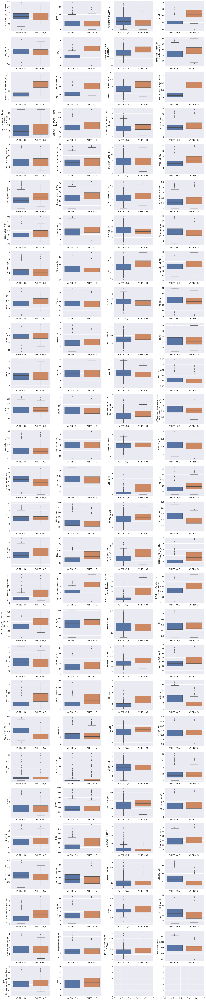

In [24]:
plot_boxplots_for_categorical_attribute(df, 'WHTR>0,5', ['WHTR < 0,5', 'WHTR > 0,5'], 'WHTR')

### Elevated DHT

Z-scores calculated for column: IGF-1 ng/ml (N: 100-311)
Filtering entries with threshold 3: 469 rows remaining out of 475. - 98.74% of the data.
Z-scores calculated for column: proBNP
Filtering entries with threshold 3: 453 rows remaining out of 456. - 99.34% of the data.
Z-scores calculated for column: AMH (ng/ml) *7,14=pmol/l
Filtering entries with threshold 3: 373 rows remaining out of 382. - 97.64% of the data.
Z-scores calculated for column: weight
Filtering entries with threshold 3: 548 rows remaining out of 553. - 99.10% of the data.
Z-scores calculated for column: height (cm)
Filtering entries with threshold 3: 551 rows remaining out of 553. - 99.64% of the data.
Z-scores calculated for column: BMI
Filtering entries with threshold 3: 544 rows remaining out of 553. - 98.37% of the data.
Z-scores calculated for column: systolic BP (ciśnienie skurczowe)
Filtering entries with threshold 3: 506 rows remaining out of 507. - 99.80% of the data.
Z-scores calculated for column: diastol

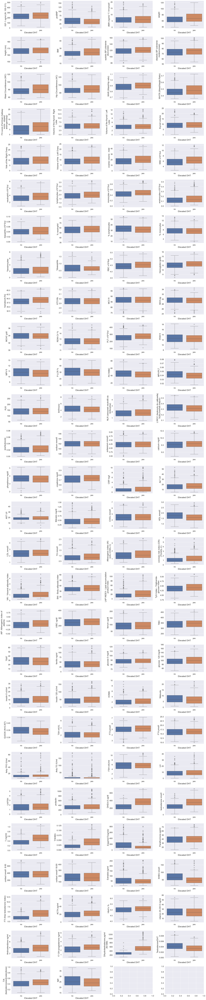

In [26]:
plot_boxplots_for_categorical_attribute(df, 'elevated DHT', ['no', 'yes'], 'WHTR', x_title='Elevated DHT')

### Chronic throiditis

Z-scores calculated for column: IGF-1 ng/ml (N: 100-311)
Filtering entries with threshold 3: 523 rows remaining out of 531. - 98.49% of the data.
Z-scores calculated for column: proBNP
Filtering entries with threshold 3: 559 rows remaining out of 563. - 99.29% of the data.
Z-scores calculated for column: AMH (ng/ml) *7,14=pmol/l
Filtering entries with threshold 3: 428 rows remaining out of 437. - 97.94% of the data.
Z-scores calculated for column: weight
Filtering entries with threshold 3: 722 rows remaining out of 730. - 98.90% of the data.
Z-scores calculated for column: height (cm)
Filtering entries with threshold 3: 726 rows remaining out of 730. - 99.45% of the data.
Z-scores calculated for column: BMI
Filtering entries with threshold 3: 718 rows remaining out of 730. - 98.36% of the data.
Z-scores calculated for column: systolic BP (ciśnienie skurczowe)
Filtering entries with threshold 3: 595 rows remaining out of 596. - 99.83% of the data.
Z-scores calculated for column: diastol

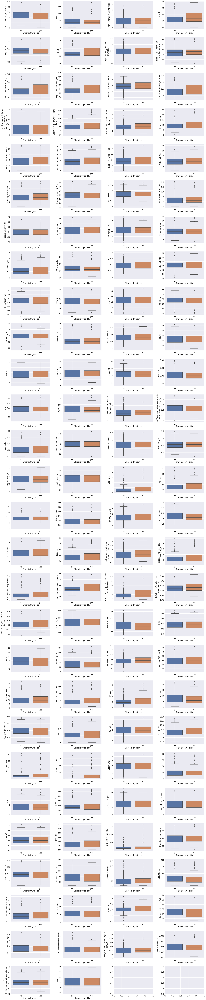

In [27]:
plot_boxplots_for_categorical_attribute(df, 'chronic thyroiditis', ['no', 'yes'], 'thyroiditis', x_title='Chronic thyroiditis')

### Stromal hypertrophy

Z-scores calculated for column: IGF-1 ng/ml (N: 100-311)
Filtering entries with threshold 3: 536 rows remaining out of 543. - 98.71% of the data.
Z-scores calculated for column: proBNP
Filtering entries with threshold 3: 476 rows remaining out of 480. - 99.17% of the data.
Z-scores calculated for column: AMH (ng/ml) *7,14=pmol/l
Filtering entries with threshold 3: 395 rows remaining out of 403. - 98.01% of the data.
Z-scores calculated for column: weight
Filtering entries with threshold 3: 704 rows remaining out of 710. - 99.15% of the data.
Z-scores calculated for column: height (cm)
Filtering entries with threshold 3: 706 rows remaining out of 710. - 99.44% of the data.
Z-scores calculated for column: BMI
Filtering entries with threshold 3: 700 rows remaining out of 710. - 98.59% of the data.
Z-scores calculated for column: systolic BP (ciśnienie skurczowe)
Filtering entries with threshold 3: 659 rows remaining out of 662. - 99.55% of the data.
Z-scores calculated for column: diastol

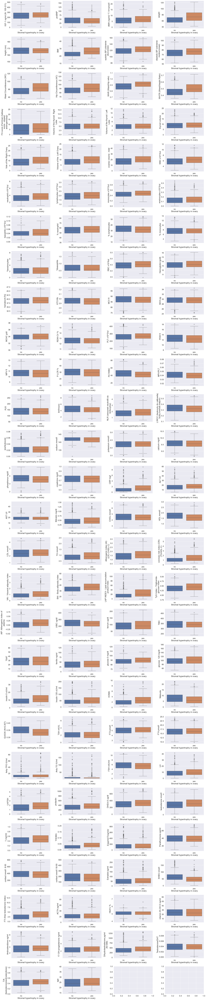

In [28]:
plot_boxplots_for_categorical_attribute(df, 'stromal hypertrophy in ovary (0-brak, 1-obecny)', ['no', 'yes'], 'stromal_hypertrophy', x_title='Stromal hypertrophy in ovary')